# Deep Convolutional Neural Networks (DCGANs)

![](https://www.researchgate.net/publication/331282441/figure/fig3/AS:729118295478273@1550846756282/Deep-convolutional-generative-adversarial-networks-DCGAN-for-generative-model-of-BF-NSP.png)

GANs can be applied in a number of ways. One of their major applications has been in image generation.

This application alone is already utilized in a number of fields, such as art, advertising, video games, face filters, fashion, architecture, and design.

GAN use is not confined to imagery, however. Aside from imagery, GANs have also been applied to create audio, 3D models, and many other miscellaneous applications across fields and disciplines.

Here's an example of generated images using [StyleGan](https://arxiv.org/pdf/1912.04958.pdf)

![](https://deeplizard.com/assets/jpg/58f5c572.jpg)

![](https://deeplizard.com/assets/jpg/cb50639b.jpg)

These people actually do not exist. These faces were generated with a GAN an they are not just filters applied to an existing image. 

GANs were originally created by [Ian Fellow](https://arxiv.org/pdf/1406.2661.pdf) back in 2014. A GAN is composed of two neural networks: a Generator Network,and a Discriminator Network. The Discriminator is just a CNN, which will do a binary classification between real and fake images. The new interesting thing to cover is the Generator Network.

This network accepts input, and from that input, generates new data. The generator's objective is to create data that is realistic or perceived to be real.The input is usually a noise vector, as ypu will see later during this notebook.

![](https://production-media.paperswithcode.com/methods/Screen_Shot_2020-07-01_at_11.27.51_PM_IoGbo1i.png)

IN contrast with the techniques applied commonly in the CNN architecture, we will apply for the Generator **upsampling techniques** in order to convert the noise vector (wchich we will denote as z) into an image (G(z) as we show in the image), so that this new image could be theinput of our Discriminator function in a further step

<font size=4 color=green>Libraries Verification

<font size=4>Since we want to execute the entire notebook without interruptions, we declare the function `version_library`, in orer to check the version of each necessary library for this purpose, and if you do not have installed in your Anaconda environment any of this packages, you could verify it here as a string, not as an execution error. 

In [1]:
from platform import python_version
import pkg_resources
def version_library(library):
    return pkg_resources.get_distribution(library).version
packages=['torch', 'torchvision','pytorch-model-summary', 
          'pillow', 'networkx' , 'matplotlib', 
          'torchviz','graphviz']

import itertools
from itertools import product
for v in product(iter(packages)):
    print(v[0])
    try:
        print(version_library(v[0]))
    except Exception as e: print(e)

torch
1.10.1
torchvision
0.11.2
pytorch-model-summary
0.1.2
pillow
7.2.0
networkx
2.5
matplotlib
3.4.3
torchviz
0.0.2
graphviz
0.16


In [2]:
import torch
import torch.nn as nn

import torchvision
import torchvision.transforms as transforms
import matplotlib.animation
import matplotlib.pyplot as plt

import numpy as np
import os
from IPython.display import HTML

from IPython.display import display, clear_output
import pandas as pd
import time
import json
from collections import OrderedDict
from tqdm.auto import tqdm

import asiri as ai

## Reproducibility

No matter how manytimes or in which part of the world we are running this notebook, we want that our results could be replied. So, we need to declare some seeds and a specific number, so you can follow our explanation in detail through this project. Pytorch offers several options to achieve reproducibility. The first and most common way is with the `manual_seed` function, as we do exactly with numpy when working with random variables.

With `torch.backends.cudnn.benchmark` Pytorch could select the fastest convolutional algorithm for our project and apply it to the Convolutional layers. However, we do not want this activated in our work, since we want to analyze and find by ourselves the impact of some strategies to accelerate this project. 

Finally, `torch.backends.cudnn.deterministic` gives us the possibility to apply deterministic convolutional algorithms to our work. [You can find here a more complete explanation of how these algorithms work](https://docs.nvidia.com/deeplearning/cudnn/developer-guide/index.html).

In [3]:
torch.manual_seed(1)
if torch.backends.cudnn.is_available():
    torch.backends.cudnn.benchmark = False
    torch.backends.cudnn.deterministic = True

We will also check if we have a GPU available for training or not. We will store this variable as `device`

In [4]:
device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
print(device)

cuda:0


# Set Params

Once we have discussed the main features we will look at when initializing our layers adn dataset, we will put all these parameters in the following cell

In [5]:
image_size = 64
num_channels = 3
z_size = 100
num_g_filters = 64
num_d_filters = 64
batch_size = 128
num_workers = 1

We will use the [325 Bird Species - Classification](https://www.kaggle.com/gpiosenka/100-bird-species) dataset, which you can download and unzip the file in a `dataset` folder, in order to folow the next ppiece of code

In [6]:
dataset = torchvision.datasets.ImageFolder(
    root=os.path.relpath('dataset/train'),
    transform=transforms.Compose([
       transforms.Resize(image_size),
       transforms.ToTensor(),
       transforms.Normalize(mean=(0.5, 0.5, 0.5), std=(0.5, 0.5, 0.5))
   ])
)

dataloader = torch.utils.data.DataLoader(
    dataset=dataset,
    batch_size=batch_size,
    shuffle=True,
    num_workers=num_workers
)

We can visualize one batch of this dataset with the next cell

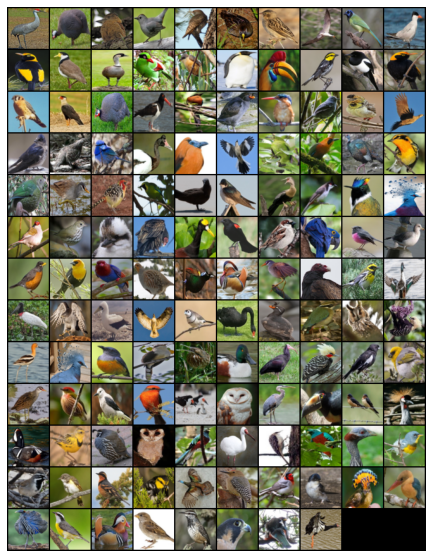

In [7]:
real_batch = next(iter(dataloader))
images, labels = real_batch

grid = torchvision.utils.make_grid(images, nrow=10, normalize=True)

plt.figure(figsize=(10,10))
plt.axis("off")
plt.imshow(grid.permute(1,2,0))

# Generator

As we have discused earliers, we will introduce the `ConvTranspose2d` layer for upsampling the vector noise, until we get the desired shape of the image. We will not use Full-Connected Layers, as the paper indicates. We will declare a `nn.Sequential` neural network using PyTorch API

In [8]:
netG = nn.Sequential(
    nn.ConvTranspose2d(
        in_channels=z_size,
        out_channels=num_g_filters * 8,
        kernel_size=4,
        stride=1,
        padding=0,
        bias=False
    ),
    nn.BatchNorm2d(num_features=num_g_filters * 8),
    nn.ReLU(inplace=True),

    nn.ConvTranspose2d(
        in_channels=num_g_filters * 8,
        out_channels=num_g_filters * 4,
        kernel_size=4,
        stride=2,
        padding=1,
        bias=False
    ),
    nn.BatchNorm2d(num_features=num_g_filters * 4),
    nn.ReLU(inplace=True),

    nn.ConvTranspose2d(
        in_channels=num_g_filters * 4,
        out_channels=num_g_filters * 2,
        kernel_size=4,
        stride=2,
        padding=1,
        bias=False
    ),
    nn.BatchNorm2d(num_features=num_g_filters * 2),
    nn.ReLU(inplace=True),

    nn.ConvTranspose2d(
        in_channels=num_g_filters * 2,
        out_channels=num_g_filters,
        kernel_size=4,
        stride=2,
        padding=1,
        bias=False
    ),
    nn.BatchNorm2d(num_features=num_g_filters),
    nn.ReLU(inplace=True),

    nn.ConvTranspose2d(
        in_channels=num_g_filters,
        out_channels=num_channels,
        kernel_size=4,
        stride=2,
        padding=1, 
        bias=False
    ),
    nn.Tanh()
)

### Weight Initialization Function

We declare a function to initialize the weights as we menitoned before in the introduction of this notebook

In [9]:
def weights_init(module):
    classname = module.__class__.__name__
    if classname.find('Conv') != -1:
        nn.init.normal_(module.weight.data, mean=0.0, std=0.02)

In [10]:
torch.cuda.device_count()

4

In [11]:
netG = netG.to(device)

if torch.cuda.device_count() > 1:
    netG = nn.DataParallel(netG)
netG.apply(weights_init)
netG

DataParallel(
  (module): Sequential(
    (0): ConvTranspose2d(100, 512, kernel_size=(4, 4), stride=(1, 1), bias=False)
    (1): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU(inplace=True)
    (3): ConvTranspose2d(512, 256, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (4): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (5): ReLU(inplace=True)
    (6): ConvTranspose2d(256, 128, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (7): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (8): ReLU(inplace=True)
    (9): ConvTranspose2d(128, 64, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (10): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (11): ReLU(inplace=True)
    (12): ConvTranspose2d(64, 3, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (13): Tanh()
 

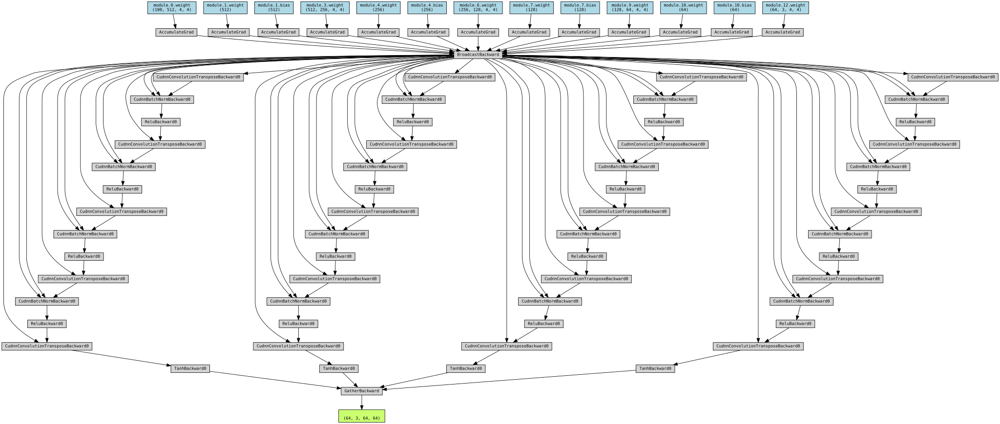

In [12]:
ai.plot_model(netG, 'generator', 64, [100,1,1])

# Discriminator

We proceed to create the architecture of the Discriminator, which is a CNN

In [13]:
netD = nn.Sequential(
    nn.Conv2d(
        in_channels=num_channels,
        out_channels=num_d_filters,
        kernel_size=4,
        stride=2,
        padding=1,
        bias=False
    ),
    nn.LeakyReLU(negative_slope=0.2, inplace=True),

    nn.Conv2d(
        in_channels=num_d_filters,
        out_channels=num_d_filters * 2,
        kernel_size=4,
        stride=2,
        padding=1,
        bias=False
    ),
    nn.BatchNorm2d(num_features=num_d_filters * 2),
    nn.LeakyReLU(negative_slope=0.2, inplace=True),

    nn.Conv2d(
        in_channels=num_d_filters * 2,
        out_channels=num_d_filters * 4,
        kernel_size=4,
        stride=2,
        padding=1,
        bias=False
    ),
    nn.BatchNorm2d(num_features=num_d_filters * 4),
    nn.LeakyReLU(negative_slope=0.2, inplace=True),

    nn.Conv2d(
        in_channels=num_d_filters * 4,
        out_channels=num_d_filters * 8,
        kernel_size=4,
        stride=2,
        padding=1,
        bias=False
    ),
    nn.BatchNorm2d(num_features=num_d_filters * 8),
    nn.LeakyReLU(negative_slope=0.2, inplace=True),

    nn.Conv2d(
        in_channels=num_d_filters * 8,
        out_channels=num_channels,
        kernel_size=4,
        stride=1,
        padding=0,
        bias=False
    ),
    nn.Sigmoid()
)

In [14]:
netD = netD.to(device)
if torch.cuda.device_count() > 1:
    netD = nn.DataParallel(netD)
netD.apply(weights_init)
netD

DataParallel(
  (module): Sequential(
    (0): Conv2d(3, 64, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (1): LeakyReLU(negative_slope=0.2, inplace=True)
    (2): Conv2d(64, 128, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (3): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (4): LeakyReLU(negative_slope=0.2, inplace=True)
    (5): Conv2d(128, 256, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (6): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (7): LeakyReLU(negative_slope=0.2, inplace=True)
    (8): Conv2d(256, 512, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (9): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (10): LeakyReLU(negative_slope=0.2, inplace=True)
    (11): Conv2d(512, 3, kernel_size=(4, 4), stride=(1, 1), bias=False)
    (12): Sigmoid()
  )
)

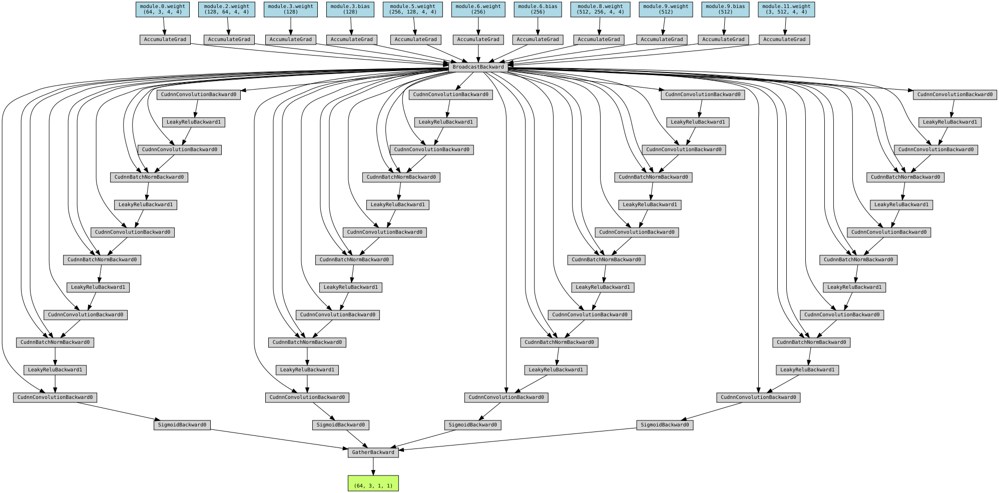

In [15]:
ai.plot_model(netD, 'discriminator', 64, [3,64,64])

We will store in the following arrays the images generated by the Generator after each epoch, and the loss of the Discriminator and Generator

In [16]:
fake_img_grids = []
g_losses = []
d_losses = []

### Generated images before training

We are now initializing a grid of images containing the predictions of the Generator. We first show that the noise vector is actually just noise.

In [17]:
fixed_noise = torch.randn(size=(64, z_size, 1, 1), device=device)

with torch.no_grad():
    fixed_fakes = netG(fixed_noise).cpu()
fake_img_grids.append(torchvision.utils.make_grid(
    fixed_fakes, padding=2, normalize=True
))

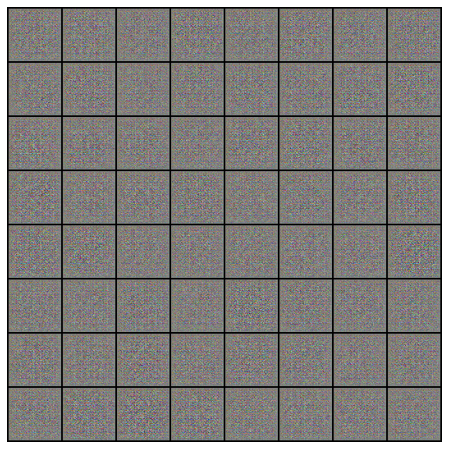

In [18]:
plt.figure(figsize=(8,8))
plt.axis("off")
plt.imshow(fake_img_grids[0].permute(1,2,0))

Following the precise step menitoned at the beginning, we will create the `discriminator_loss` function, so we can take the real and fake output separately

In [19]:
bce_loss = nn.BCELoss()
def discriminator_loss(real_output, fake_output):
    real_loss = bce_loss(real_output, torch.ones_like(real_output))
    fake_loss = bce_loss(fake_output, torch.zeros_like(fake_output))
    return real_loss + fake_loss

We can also declare the corresponding loss for the generator, using the fact that we will label the fake output as real, as we aim to minimize this particular loss function

In [20]:
def generator_loss(fake_output):
    return bce_loss(fake_output, torch.ones_like(fake_output))

# Training loop

We set the hyperparameters as an Ordered Dictionary as follow, so we can use the `RunBuilder` class in the `asiri` module

In [21]:
params=OrderedDict(
    epochs = [10],
    lr = [0.0002],
    betas = [(0.5, 0.999)]
)

In [22]:
stats = ai.RunManager(batches_per_epoch=len(dataloader))
for run in ai.RunBuilder.get_runs(params):
    
    d_optimizer = torch.optim.Adam(netD.parameters(), lr=run.lr, betas=run.betas)
    g_optimizer = torch.optim.Adam(netG.parameters(), lr=run.lr, betas=run.betas)
    
    stats.begin_run()
    for epoch in range(run.epochs):
        stats.begin_epoch()

        for batch in dataloader:

            # TRAIN DISCRIMINATOR
            netD.zero_grad()

            real_images = batch[0].to(device)
            real_output = netD(real_images)  

            noise = torch.randn(real_images.size(0), z_size, 1, 1).to(device)
            fake_images = netG(noise)
            fake_output = netD(fake_images.detach())

            d_loss = discriminator_loss(real_output, fake_output)
            d_loss.backward()
            d_optimizer.step()

            stats.track('real_mean', real_output.mean().item())
            stats.track('fake_mean1', fake_output.mean().item())
            stats.track('d_loss', d_loss.item())

            # TRAIN GENERATOR
            netG.zero_grad()
            fake_output = netD(fake_images)
            g_loss = generator_loss(fake_output)
            g_loss.backward()
            g_optimizer.step()

            stats.track('g_loss', g_loss.item())
            stats.track('fake_mean2', fake_output.mean().item())
            stats.progress.update()

        with torch.no_grad():
            fixed_fakes = netG(fixed_noise).cpu()
        fake_img_grids.append(torchvision.utils.make_grid(fixed_fakes, padding=2, normalize=True))

        g_losses.append(sum(stats.epoch_data['g_loss'])/len(dataloader))
        d_losses.append(sum(stats.epoch_data['d_loss'])/len(dataloader))

        stats.add_result('D loss', sum(stats.epoch_data['d_loss'])/len(dataloader))
        stats.add_result('G loss', sum(stats.epoch_data['g_loss'])/len(dataloader))
        stats.add_result('avg D(x)', sum(stats.epoch_data['real_mean'])/len(dataloader))
        stats.add_result('avg D(G(z)) pre', sum(stats.epoch_data['fake_mean1'])/len(dataloader))
        stats.add_result('avg D(G(z)) post', sum(stats.epoch_data['fake_mean2'])/len(dataloader))

        stats.end_epoch()
    stats.end_run()

,run,epoch,epoch duration,run duration,D loss,G loss,avg D(x),avg D(G(z)) pre,avg D(G(z)) post
0,1,1,79.579971,79.579981,0.590344,5.640659,0.805156,0.190102,0.020240
1,1,2,79.779072,159.360116,0.571122,4.458981,0.802084,0.190733,0.036362
2,1,3,81.412253,240.773322,0.531221,4.328705,0.821982,0.172637,0.046725
3,1,4,80.001716,320.776297,0.583615,3.866637,0.801348,0.194933,0.063412
4,1,5,79.034768,399.812045,0.516030,3.714632,0.818772,0.178095,0.064132
5,1,6,78.606058,478.419240,0.550055,3.862179,0.814149,0.182917,0.065777
6,1,7,79.200595,557.621119,0.553463,3.840492,0.812412,0.186102,0.071178
7,1,8,81.099709,638.722413,0.606701,3.349148,0.797351,0.200136,0.095174
8,1,9,79.476672,718.200243,0.666519,3.059950,0.783904,0.215912,0.116232
9,1,10,79.733564,797.934650,0.612659,3.086135,0.791596,0.207401,0.110832


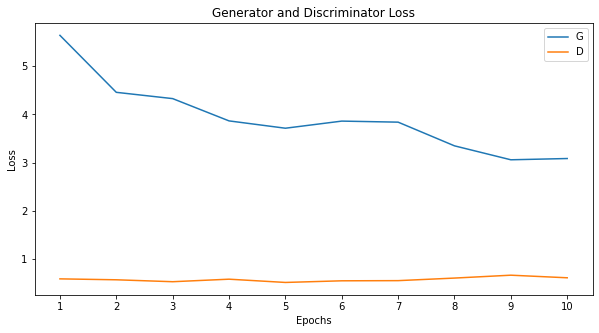

In [23]:

plt.figure(figsize=(10,5))
plt.title("Generator and Discriminator Loss")
plt.plot(g_losses,label="G")
plt.plot(d_losses,label="D")
plt.xlabel("Epochs")
plt.ylabel("Loss")
plt.xticks(ticks=np.arange(len(g_losses)), labels=np.arange(1, len(g_losses)+1))
plt.legend()
plt.show()

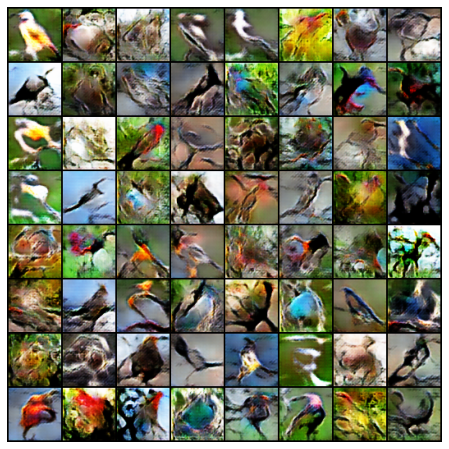

In [24]:
fig = plt.figure(figsize=(8,8))
plt.axis("off")
frames = [[plt.imshow(grid.permute(1,2,0), animated=True)] for grid in fake_img_grids]
animation = matplotlib.animation.ArtistAnimation(
    fig, frames, interval=1000, repeat_delay=1000, blit=True
)

HTML(animation.to_jshtml())

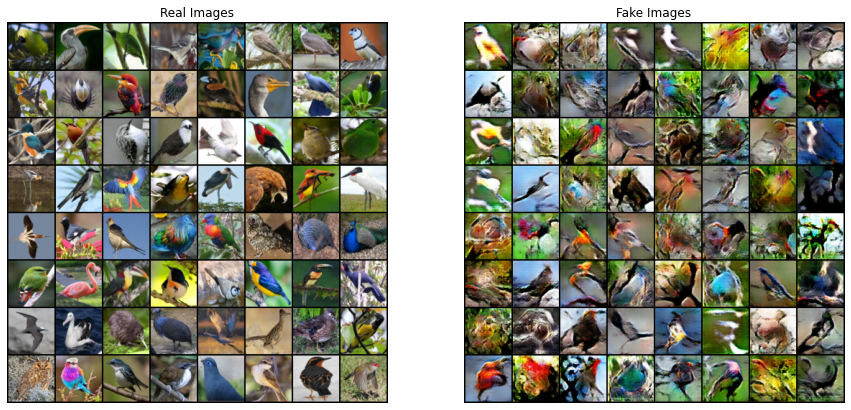

In [25]:
real_batch = next(iter(dataloader))
images, labels = real_batch

real_grid = torchvision.utils.make_grid(images[:64], nrow=8, normalize=True)

plt.figure(figsize=(15,15))

plt.subplot(1,2,1)
plt.axis("off")
plt.title("Real Images")
plt.imshow(real_grid.permute(1,2,0))

plt.subplot(1,2,2)
plt.axis("off")
plt.title("Fake Images")
plt.imshow(fake_img_grids[-1].permute(1,2,0))

plt.show()

In [30]:
torch.save(netG.state_dict(), 'generator10')

In [31]:
torch.save(netD.state_dict(), 'discriminator10')

In [32]:
import joblib

In [33]:
joblib.dump(fake_img_grids, 'images_per_epoch_10')

['images_per_epoch_10']